# Store Location Analysis 

In [342]:
import numpy as np
import pandas as pd
import os
# for rending maps
import folium
from geopy.geocoders import Nominatim
import matplotlib.pyplot as plt

In [343]:
#Read the analytics csv file and store our dataset into a dataframe called "df"
df = pd.read_excel('excercise.xlsx', sheet_name='Sheet1')

In [344]:
df.dropna(inplace=True)

In [345]:
year_2019 = pd.read_excel('Year2019_.xlsx')

In [346]:
df

,Store no,Store name,Country short name,Country name,latitude,longitude,Street Address,Postcode,Location,Year,...,KmDist conad,KmDist simply market,KmDist coop,KmDist hyper u,KmDist netto,KmDist alnatura,KmDist costco,KmDist migros,KmDist sisa supermercato,KmDist spar
0,3080,Pöls,AT,Österreich,47.219862,14.581737,Marktplatz 20,8761.0,Pöls,2016,...,164.929236,262.527533,109.988678,626.423495,138.895438,201.733547,1139.500529,443.399543,266.490022,8.749428
1,3080,Pöls,AT,Österreich,47.219862,14.581737,Marktplatz 20,8761.0,Pöls,2017,...,164.929236,262.527533,109.988678,626.423495,138.895438,201.733547,1139.500529,443.399543,266.490022,8.749428
2,3080,Pöls,AT,Österreich,47.219862,14.581737,Marktplatz 20,8761.0,Pöls,2018,...,164.929236,262.527533,109.988678,626.423495,138.895438,201.733547,1139.500529,443.399543,266.490022,8.749428
3,3080,Pöls,AT,Österreich,47.219862,14.581737,Marktplatz 20,8761.0,Pöls,2019,...,164.929236,262.527533,109.988678,626.423495,138.895438,201.733547,1139.500529,443.399543,266.490022,8.749428
4,3086,Schwarzach,AT,Österreich,47.320710,13.147206,Salzburger Str. 30,5620.0,Schwarzach,2016,...,92.693275,218.303711,91.665871,518.124867,50.166936,99.980577,1040.264622,334.271055,199.749368,0.274233
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6643,6054,Ormo,SI,Slowenien,46.407300,16.147953,Ptujska Cesta 2,2270.0,Ormoz,2019,...,201.452653,314.017729,197.112929,752.122476,288.295971,348.418546,1288.428631,577.754208,342.968757,131.929216
6644,6083,"Nova Gorica, Supernova",SI,Slowenien,45.960662,13.638455,Prvomajska Ulica 35,5600.0,Nova Gorica,2016,...,19.142490,116.307629,2.057590,570.545530,135.180021,241.160093,1156.187904,411.209526,143.773792,101.340430
6645,6083,"Nova Gorica, Supernova",SI,Slowenien,45.960662,13.638455,Prvomajska Ulica 35,5600.0,Nova Gorica,2017,...,19.142490,116.307629,2.057590,570.545530,135.180021,241.160093,1156.187904,411.209526,143.773792,101.340430
6646,6083,"Nova Gorica, Supernova",SI,Slowenien,45.960662,13.638455,Prvomajska Ulica 35,5600.0,Nova Gorica,2018,...,19.142490,116.307629,2.057590,570.545530,135.180021,241.160093,1156.187904,411.209526,143.773792,101.340430


In [347]:
address = 'Europe'
geolocator = Nominatim(user_agent="Europe")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print(f'The geograpical coordinates of Europe are {latitude}, {longitude}')

The geograpical coordinates of Europe are 51.0, 10.0


In [348]:
# create map of Madrid using latitude and longitude values
map_store_locations = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map
for lat, lng, label in zip(year_2019['latitude'], year_2019['longitude'], year_2019['Store name']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_store_locations)  
    
map_store_locations

In [349]:
#one hot encoding

In [350]:
df_one_hot_encoding_location_types_Y2019= pd.get_dummies(df[['Location type']], prefix="",prefix_sep="")

In [351]:
df_one_hot_encoding_location_types_Y2019['Store name'] = df['Store name']

In [352]:
# move store column to the first column
fixed_columns = [df_one_hot_encoding_location_types_Y2019.columns[-1]] + list(df_one_hot_encoding_location_types_Y2019.columns[:-1])
store_onehot = df_one_hot_encoding_location_types_Y2019[fixed_columns]

print(f'Size: {store_onehot.shape}')
store_onehot.head()

Size: (6291, 6)


,Store name,Main shopping street,Outskirts / residential,Pedestrian zone,Shopping center,Specialist retail center
0,Pöls,1,0,0,0,0
1,Pöls,1,0,0,0,0
2,Pöls,1,0,0,0,0
3,Pöls,1,0,0,0,0
4,Schwarzach,0,1,0,0,0


In [353]:
nearby_venues_to_store=df[['Train stations within 500m','Public transport stop within 50m','Public transport stop within 100m','Bank ATM within 5km','ATM within 5km','Shop within 5km','Resteraunts, cafes or pubs within 5km','Parking spaces within 5km','Bank ATM within 500m','ATM within 500m','Bank ATM within 100m','ATM within 100m','Resteraunts, cafes or pubs within 50m','Resteraunts, cafes or pubs within 500m','Shop within 100m','Shop within 50m','Shop within 500m','Public transport stop within 200m']]

In [356]:
nearby_venues_to_store['Store name']=df['Store name']

<ipython-input-356-f93d6b7256f5>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nearby_venues_to_store['Store name']=df['Store name']


In [357]:
# move neighbourhood column to the first column
fixed_columns = [nearby_venues_to_store.columns[-1]] + list(nearby_venues_to_store.columns[:-1])
nearby_venues_to_store_ = nearby_venues_to_store[fixed_columns]
print(f'Size: {nearby_venues_to_store_.shape}')
nearby_venues_to_store_.head()

Size: (6291, 19)


,Store name,Train stations within 500m,Public transport stop within 50m,Public transport stop within 100m,Bank ATM within 5km,ATM within 5km,Shop within 5km,"Resteraunts, cafes or pubs within 5km",Parking spaces within 5km,Bank ATM within 500m,ATM within 500m,Bank ATM within 100m,ATM within 100m,"Resteraunts, cafes or pubs within 50m","Resteraunts, cafes or pubs within 500m",Shop within 100m,Shop within 50m,Shop within 500m,Public transport stop within 200m
0,Pöls,0.0,0.0,0.0,1.0,0.0,15.0,8.0,13.0,1.0,0.0,1.0,0.0,0.0,2.0,1.0,1.0,5.0,0.0
1,Pöls,0.0,0.0,0.0,1.0,0.0,15.0,8.0,13.0,1.0,0.0,1.0,0.0,0.0,2.0,1.0,1.0,5.0,0.0
2,Pöls,0.0,0.0,0.0,1.0,0.0,15.0,8.0,13.0,1.0,0.0,1.0,0.0,0.0,2.0,1.0,1.0,5.0,0.0
3,Pöls,0.0,0.0,0.0,1.0,0.0,15.0,8.0,13.0,1.0,0.0,1.0,0.0,0.0,2.0,1.0,1.0,5.0,0.0
4,Schwarzach,0.0,0.0,0.0,4.0,1.0,69.0,34.0,55.0,3.0,1.0,0.0,0.0,0.0,15.0,7.0,2.0,43.0,2.0


In [358]:
Store_grouped = nearby_venues_to_store_.groupby('Store name').mean().reset_index()
print(f'Size: {Store_grouped.shape}')
Store_grouped.head()


Size: (1716, 19)


,Store name,Train stations within 500m,Public transport stop within 50m,Public transport stop within 100m,Bank ATM within 5km,ATM within 5km,Shop within 5km,"Resteraunts, cafes or pubs within 5km",Parking spaces within 5km,Bank ATM within 500m,ATM within 500m,Bank ATM within 100m,ATM within 100m,"Resteraunts, cafes or pubs within 50m","Resteraunts, cafes or pubs within 500m",Shop within 100m,Shop within 50m,Shop within 500m,Public transport stop within 200m
0,Aachen,0.0,0.0,2.0,104.0,67.0,1391.0,510.0,598.0,9.0,6.0,4.0,3.0,2.0,25.0,27.0,14.0,72.0,4.0
1,Aalen,1.0,11.0,12.0,33.0,13.0,344.0,139.0,391.0,24.0,10.0,3.0,2.0,1.0,83.0,31.0,11.0,232.0,12.0
2,Abensberg-Abensberger Ekz,0.0,0.0,0.0,5.0,1.0,68.0,31.0,41.0,3.0,1.0,1.0,0.0,0.0,4.0,7.0,1.0,35.0,3.0
3,Abtenau,0.0,0.0,0.0,3.0,0.0,29.0,18.0,38.0,3.0,0.0,2.0,0.0,1.0,7.0,2.0,0.0,24.0,0.0
4,Achim,2.0,0.0,0.0,10.0,3.0,77.0,29.0,143.0,4.0,0.0,1.0,0.0,0.0,16.0,7.0,4.0,31.0,4.0


In [359]:
# Load data from file taking into account the table headers are on the 4th row and the population need to be converted to integer.
df_population_within_1km=df[['Store name','Population within 1km','Supermarkets within 500m']]


In [360]:
df_population_within_1km

,Store name,Population within 1km,Supermarkets within 500m
0,Pöls,1667,1.0
1,Pöls,1667,1.0
2,Pöls,1667,1.0
3,Pöls,1667,1.0
4,Schwarzach,3740,5.0
...,...,...,...
6643,Ormo,107,0.0
6644,"Nova Gorica, Supernova",1273,2.0
6645,"Nova Gorica, Supernova",1273,2.0
6646,"Nova Gorica, Supernova",1273,2.0


In [361]:
income_ofhousehold_locatednearStore=df[['Store name','Household with 1km Purchasing Power Index']]

In [362]:
income_ofhousehold_locatednearStore

,Store name,Household with 1km Purchasing Power Index
0,Pöls,79.8
1,Pöls,79.8
2,Pöls,79.8
3,Pöls,79.8
4,Schwarzach,92.9
...,...,...
6643,Ormo,78.4
6644,"Nova Gorica, Supernova",117.4
6645,"Nova Gorica, Supernova",117.4
6646,"Nova Gorica, Supernova",117.4


In [363]:
# Function for sorting the venues in descencing order
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]


In [364]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Store name']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighbourhoods_venues_sorted = pd.DataFrame(columns=columns)
neighbourhoods_venues_sorted['Store name'] = Store_grouped['Store name']

for ind in np.arange(Store_grouped.shape[0]):
    neighbourhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(Store_grouped.iloc[ind, :], num_top_venues)

neighbourhoods_venues_sorted.head()

,Store name,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Aachen,Shop within 5km,Parking spaces within 5km,"Resteraunts, cafes or pubs within 5km",Bank ATM within 5km,Shop within 500m,ATM within 5km,Shop within 100m,"Resteraunts, cafes or pubs within 500m",Shop within 50m,Bank ATM within 500m
1,Aalen,Parking spaces within 5km,Shop within 5km,Shop within 500m,"Resteraunts, cafes or pubs within 5km","Resteraunts, cafes or pubs within 500m",Bank ATM within 5km,Shop within 100m,Bank ATM within 500m,ATM within 5km,Public transport stop within 100m
2,Abensberg-Abensberger Ekz,Shop within 5km,Parking spaces within 5km,Shop within 500m,"Resteraunts, cafes or pubs within 5km",Shop within 100m,Bank ATM within 5km,"Resteraunts, cafes or pubs within 500m",Public transport stop within 200m,Bank ATM within 500m,ATM within 500m
3,Abtenau,Parking spaces within 5km,Shop within 5km,Shop within 500m,"Resteraunts, cafes or pubs within 5km","Resteraunts, cafes or pubs within 500m",Bank ATM within 500m,Bank ATM within 5km,Shop within 100m,Bank ATM within 100m,"Resteraunts, cafes or pubs within 50m"
4,Achim,Parking spaces within 5km,Shop within 5km,Shop within 500m,"Resteraunts, cafes or pubs within 5km","Resteraunts, cafes or pubs within 500m",Bank ATM within 5km,Shop within 100m,Public transport stop within 200m,Bank ATM within 500m,Shop within 50m


In [365]:
Store_grouped

,Store name,Train stations within 500m,Public transport stop within 50m,Public transport stop within 100m,Bank ATM within 5km,ATM within 5km,Shop within 5km,"Resteraunts, cafes or pubs within 5km",Parking spaces within 5km,Bank ATM within 500m,ATM within 500m,Bank ATM within 100m,ATM within 100m,"Resteraunts, cafes or pubs within 50m","Resteraunts, cafes or pubs within 500m",Shop within 100m,Shop within 50m,Shop within 500m,Public transport stop within 200m
0,Aachen,0.0,0.0,2.0,104.0,67.0,1391.0,510.0,598.0,9.0,6.0,4.0,3.0,2.0,25.0,27.0,14.0,72.0,4.0
1,Aalen,1.0,11.0,12.0,33.0,13.0,344.0,139.0,391.0,24.0,10.0,3.0,2.0,1.0,83.0,31.0,11.0,232.0,12.0
2,Abensberg-Abensberger Ekz,0.0,0.0,0.0,5.0,1.0,68.0,31.0,41.0,3.0,1.0,1.0,0.0,0.0,4.0,7.0,1.0,35.0,3.0
3,Abtenau,0.0,0.0,0.0,3.0,0.0,29.0,18.0,38.0,3.0,0.0,2.0,0.0,1.0,7.0,2.0,0.0,24.0,0.0
4,Achim,2.0,0.0,0.0,10.0,3.0,77.0,29.0,143.0,4.0,0.0,1.0,0.0,0.0,16.0,7.0,4.0,31.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1711,Ðakovo,0.0,0.0,0.0,17.0,9.0,71.0,62.0,48.0,12.0,4.0,6.0,2.0,1.0,42.0,2.0,1.0,16.0,0.0
1712,Öhringen,1.5,0.5,0.5,16.5,6.0,154.0,61.5,197.5,6.0,2.5,2.0,1.0,1.5,17.0,14.5,3.0,51.0,4.0
1713,Östringen,0.0,0.0,0.0,13.0,3.0,70.0,36.0,140.0,1.0,1.0,0.0,0.0,0.0,2.0,0.0,0.0,22.0,0.0
1714,Öttingen,0.0,0.0,0.0,7.0,1.0,37.0,19.0,28.0,4.0,1.0,2.0,0.0,1.0,16.0,9.0,5.0,23.0,0.0


1 2 3 4 5 6 7 8 9 

Text(0.5, 1.0, 'Elbow Method For Optimal k')

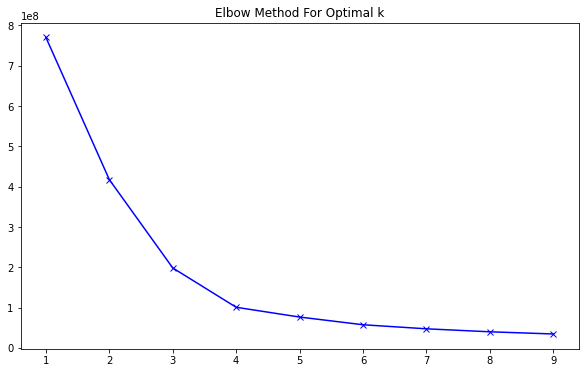

In [366]:
#cluster formation of data using K-means
from sklearn.cluster import KMeans
store_grouped_clustering =Store_grouped.drop('Store name', 1)
sum_of_squared_distances = []
K = range(1,10)

for k in K:
    print(k, end=' ')
    kmeans = KMeans(n_clusters=k, random_state=1, n_init=20).fit(store_grouped_clustering)
    sum_of_squared_distances.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(K, sum_of_squared_distances, 'bx-')
plt.title('Elbow Method For Optimal k')

In [367]:
# set number of clusters
kclusters = 5

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=100).fit(store_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:6]

array([0, 4, 1, 1, 1, 1])

In [368]:
df_store=df[['Store name','latitude','longitude']]

In [386]:
# add clustering labels
#neighbourhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

store_data_merged = df_store

# merge madrid_grouped with df_madrid to add latitude/longitude for each neighbourhood
store_data_merged = store_data_merged.join(neighbourhoods_venues_sorted.set_index('Store name'), on='Store name')

store_data_merged.head()
##store_data_merged.to_excel('clustered_data.xlsx')

,Store name,latitude,longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Pöls,47.219862,14.581737,1,Shop within 5km,Parking spaces within 5km,"Resteraunts, cafes or pubs within 5km",Shop within 500m,"Resteraunts, cafes or pubs within 500m",Bank ATM within 500m,Shop within 50m,Shop within 100m,Bank ATM within 100m,Bank ATM within 5km
1,Pöls,47.219862,14.581737,1,Shop within 5km,Parking spaces within 5km,"Resteraunts, cafes or pubs within 5km",Shop within 500m,"Resteraunts, cafes or pubs within 500m",Bank ATM within 500m,Shop within 50m,Shop within 100m,Bank ATM within 100m,Bank ATM within 5km
2,Pöls,47.219862,14.581737,1,Shop within 5km,Parking spaces within 5km,"Resteraunts, cafes or pubs within 5km",Shop within 500m,"Resteraunts, cafes or pubs within 500m",Bank ATM within 500m,Shop within 50m,Shop within 100m,Bank ATM within 100m,Bank ATM within 5km
3,Pöls,47.219862,14.581737,1,Shop within 5km,Parking spaces within 5km,"Resteraunts, cafes or pubs within 5km",Shop within 500m,"Resteraunts, cafes or pubs within 500m",Bank ATM within 500m,Shop within 50m,Shop within 100m,Bank ATM within 100m,Bank ATM within 5km
4,Schwarzach,47.320710,13.147206,1,Shop within 5km,Parking spaces within 5km,Shop within 500m,"Resteraunts, cafes or pubs within 5km","Resteraunts, cafes or pubs within 500m",Shop within 100m,Bank ATM within 5km,Bank ATM within 500m,Public transport stop within 200m,Shop within 50m


In [372]:
#visualizing the clusters
import matplotlib.cm as cm
import matplotlib.colors as colors

# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, area, cluster in zip(store_data_merged['latitude'], store_data_merged['longitude'], store_data_merged['Store name'], store_data_merged['Cluster Labels']):
    label = folium.Popup((str(area)) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster)-1],
        fill=True,
        fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [373]:

store_data_merged.loc[store_data_merged['Cluster Labels'] == 0, store_data_merged.columns[[0] + list(range(4, store_data_merged.shape[1]))]]
store_data_merged['Store name']=df['Location type']

In [375]:
store_data_merged.to_excel('jigy1.xlsx')

In [376]:
store_data_merged.loc[store_data_merged['Cluster Labels'] == 1, store_data_merged.columns[[0] + list(range(4, store_data_merged.shape[1]))]]


In [377]:
store_data_merged.loc[store_data_merged['Cluster Labels'] == 2, store_data_merged.columns[[0] + list(range(4, store_data_merged.shape[1]))]]


In [387]:
store_data_merged.loc[store_data_merged['Cluster Labels'] == 3, store_data_merged.columns[[0] + list(range(4, store_data_merged.shape[1]))]]


,Store name,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1518,München - Au-Haidhausen,Shop within 5km,"Resteraunts, cafes or pubs within 5km",Parking spaces within 5km,Shop within 500m,Bank ATM within 5km,"Resteraunts, cafes or pubs within 500m",ATM within 5km,Shop within 100m,Public transport stop within 200m,Bank ATM within 500m
1519,München - Au-Haidhausen,Shop within 5km,"Resteraunts, cafes or pubs within 5km",Parking spaces within 5km,Shop within 500m,Bank ATM within 5km,"Resteraunts, cafes or pubs within 500m",ATM within 5km,Shop within 100m,Public transport stop within 200m,Bank ATM within 500m
1520,München - Au-Haidhausen,Shop within 5km,"Resteraunts, cafes or pubs within 5km",Parking spaces within 5km,Shop within 500m,Bank ATM within 5km,"Resteraunts, cafes or pubs within 500m",ATM within 5km,Shop within 100m,Public transport stop within 200m,Bank ATM within 500m
1521,München - Au-Haidhausen,Shop within 5km,"Resteraunts, cafes or pubs within 5km",Parking spaces within 5km,Shop within 500m,Bank ATM within 5km,"Resteraunts, cafes or pubs within 500m",ATM within 5km,Shop within 100m,Public transport stop within 200m,Bank ATM within 500m
2695,Berlin Treptow-Köpenick,Shop within 5km,"Resteraunts, cafes or pubs within 5km",Parking spaces within 5km,Bank ATM within 5km,ATM within 5km,Shop within 500m,"Resteraunts, cafes or pubs within 500m",Public transport stop within 200m,Bank ATM within 500m,ATM within 500m
2696,Berlin Treptow-Köpenick,Shop within 5km,"Resteraunts, cafes or pubs within 5km",Parking spaces within 5km,Bank ATM within 5km,ATM within 5km,Shop within 500m,"Resteraunts, cafes or pubs within 500m",Public transport stop within 200m,Bank ATM within 500m,ATM within 500m
2697,Berlin Treptow-Köpenick,Shop within 5km,"Resteraunts, cafes or pubs within 5km",Parking spaces within 5km,Bank ATM within 5km,ATM within 5km,Shop within 500m,"Resteraunts, cafes or pubs within 500m",Public transport stop within 200m,Bank ATM within 500m,ATM within 500m
2698,Berlin Treptow-Köpenick,Shop within 5km,"Resteraunts, cafes or pubs within 5km",Parking spaces within 5km,Bank ATM within 5km,ATM within 5km,Shop within 500m,"Resteraunts, cafes or pubs within 500m",Public transport stop within 200m,Bank ATM within 500m,ATM within 500m
4738,"Wien, Zentag",Shop within 5km,"Resteraunts, cafes or pubs within 5km",Parking spaces within 5km,Bank ATM within 5km,ATM within 5km,Shop within 500m,"Resteraunts, cafes or pubs within 500m",Bank ATM within 500m,ATM within 500m,Public transport stop within 200m
4739,"Wien, Zentag",Shop within 5km,"Resteraunts, cafes or pubs within 5km",Parking spaces within 5km,Bank ATM within 5km,ATM within 5km,Shop within 500m,"Resteraunts, cafes or pubs within 500m",Bank ATM within 500m,ATM within 500m,Public transport stop within 200m


In [388]:

df_residential = df[df['Store name'].isin(store_data_merged.loc[store_data_merged['Cluster Labels'] == 3, 'Store name'])]


In [389]:
df_residential

,Store no,Store name,Country short name,Country name,latitude,longitude,Street Address,Postcode,Location,Year,...,KmDist conad,KmDist simply market,KmDist coop,KmDist hyper u,KmDist netto,KmDist alnatura,KmDist costco,KmDist migros,KmDist sisa supermercato,KmDist spar
1518,1792,München - Au-Haidhausen,DE,Deutschland,48.128148,11.601671,Weißenburger Str. 44,81667.0,München,2016,...,133.280286,304.534822,147.648883,418.073543,3.195521,0.294334,894.954456,226.250440,261.410440,4.771616
1519,1792,München - Au-Haidhausen,DE,Deutschland,48.128148,11.601671,Weißenburger Str. 44,81667.0,München,2017,...,133.280286,304.534822,147.648883,418.073543,3.195521,0.294334,894.954456,226.250440,261.410440,4.771616
1520,1792,München - Au-Haidhausen,DE,Deutschland,48.128148,11.601671,Weißenburger Str. 44,81667.0,München,2018,...,133.280286,304.534822,147.648883,418.073543,3.195521,0.294334,894.954456,226.250440,261.410440,4.771616
1521,1792,München - Au-Haidhausen,DE,Deutschland,48.128148,11.601671,Weißenburger Str. 44,81667.0,München,2019,...,133.280286,304.534822,147.648883,418.073543,3.195521,0.294334,894.954456,226.250440,261.410440,4.771616
2695,2228,Berlin Treptow-Köpenick,DE,Deutschland,52.469281,13.512509,Rummelsburger Str. 16,12459.0,Berlin,2016,...,624.548412,500.341508,252.219553,769.230939,1.535046,7.838921,914.410843,649.885269,754.151319,1.801925
2696,2228,Berlin Treptow-Köpenick,DE,Deutschland,52.469281,13.512509,Rummelsburger Str. 16,12459.0,Berlin,2017,...,624.548412,500.341508,252.219553,769.230939,1.535046,7.838921,914.410843,649.885269,754.151319,1.801925
2697,2228,Berlin Treptow-Köpenick,DE,Deutschland,52.469281,13.512509,Rummelsburger Str. 16,12459.0,Berlin,2018,...,624.548412,500.341508,252.219553,769.230939,1.535046,7.838921,914.410843,649.885269,754.151319,1.801925
2698,2228,Berlin Treptow-Köpenick,DE,Deutschland,52.469281,13.512509,Rummelsburger Str. 16,12459.0,Berlin,2019,...,624.548412,500.341508,252.219553,769.230939,1.535046,7.838921,914.410843,649.885269,754.151319,1.801925
4738,3344,"Wien, Zentag",AT,Österreich,48.187146,16.359523,Zentagasse 11-13,1050.0,Wien,2016,...,334.792865,432.703673,68.452115,766.392335,196.297465,322.576606,1210.414412,576.147644,437.643582,86.793744
4739,3344,"Wien, Zentag",AT,Österreich,48.187146,16.359523,Zentagasse 11-13,1050.0,Wien,2017,...,334.792865,432.703673,68.452115,766.392335,196.297465,322.576606,1210.414412,576.147644,437.643582,86.793744


In [84]:
data_join=df[['latitude','longitude','Store name']]

In [301]:
# Left join with income dataframe
df_data = df_residential.merge(data_join, how='left', on='Store name')
print(df_data.shape)
df_data.head()


(480, 99)


,Store no,Store name,Country short name,Country name,latitude_x,longitude_x,Street Address,Postcode,Location,Year,...,KmDist hyper u,KmDist netto,KmDist alnatura,KmDist costco,KmDist migros,KmDist sisa supermercato,KmDist spar,People per Market,latitude_y,longitude_y
0,3110,"Graz, Annenstr",AT,Österreich,47.071309,15.426887,Annenstr. 30,8020.0,Graz,2017,...,690.80204,203.308996,267.570965,1203.354818,509.050476,313.164581,68.364388,4563.0,47.071309,15.426887
1,3110,"Graz, Annenstr",AT,Österreich,47.071309,15.426887,Annenstr. 30,8020.0,Graz,2017,...,690.80204,203.308996,267.570965,1203.354818,509.050476,313.164581,68.364388,4563.0,47.071309,15.426887
2,3110,"Graz, Annenstr",AT,Österreich,47.071309,15.426887,Annenstr. 30,8020.0,Graz,2017,...,690.80204,203.308996,267.570965,1203.354818,509.050476,313.164581,68.364388,4563.0,47.071309,15.426887
3,3110,"Graz, Annenstr",AT,Österreich,47.071309,15.426887,Annenstr. 30,8020.0,Graz,2018,...,690.80204,203.308996,267.570965,1203.354818,509.050476,313.164581,68.364388,4563.0,47.071309,15.426887
4,3110,"Graz, Annenstr",AT,Österreich,47.071309,15.426887,Annenstr. 30,8020.0,Graz,2018,...,690.80204,203.308996,267.570965,1203.354818,509.050476,313.164581,68.364388,4563.0,47.071309,15.426887


In [391]:
df_population_within_1km
# Left join with income dataframe
df_data_req = df_residential.merge(df_population_within_1km, how='left', on='Store name')
print(df_data_req.shape)
df_data_req.head()


(132, 98)


,Store no,Store name,Country short name,Country name,latitude,longitude,Street Address,Postcode,Location,Year,...,KmDist coop,KmDist hyper u,KmDist netto,KmDist alnatura,KmDist costco,KmDist migros,KmDist sisa supermercato,KmDist spar,Population within 1km_y,Supermarkets within 500m_y
0,1792,München - Au-Haidhausen,DE,Deutschland,48.128148,11.601671,Weißenburger Str. 44,81667.0,München,2016,...,147.648883,418.073543,3.195521,0.294334,894.954456,226.25044,261.41044,4.771616,37522,7.0
1,1792,München - Au-Haidhausen,DE,Deutschland,48.128148,11.601671,Weißenburger Str. 44,81667.0,München,2016,...,147.648883,418.073543,3.195521,0.294334,894.954456,226.25044,261.41044,4.771616,37522,7.0
2,1792,München - Au-Haidhausen,DE,Deutschland,48.128148,11.601671,Weißenburger Str. 44,81667.0,München,2016,...,147.648883,418.073543,3.195521,0.294334,894.954456,226.25044,261.41044,4.771616,37522,7.0
3,1792,München - Au-Haidhausen,DE,Deutschland,48.128148,11.601671,Weißenburger Str. 44,81667.0,München,2016,...,147.648883,418.073543,3.195521,0.294334,894.954456,226.25044,261.41044,4.771616,37522,7.0
4,1792,München - Au-Haidhausen,DE,Deutschland,48.128148,11.601671,Weißenburger Str. 44,81667.0,München,2017,...,147.648883,418.073543,3.195521,0.294334,894.954456,226.25044,261.41044,4.771616,37522,7.0


In [393]:
residential=df_data_req[['Store name','Household with 1km Purchasing Power Index','latitude','longitude','Population within 1km_y','Supermarkets within 500m_y']]

In [398]:
residential['People per Market'] = residential.apply(lambda x: (x['Population within 1km_y'] // x['Supermarkets within 500m_y']) if x['Supermarkets within 500m_y'] > 0 else x['Population within 1km_y'], axis=1)
print(residential.shape)
residential.head()

(132, 7)


<ipython-input-398-95848dedc6a9>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  residential['People per Market'] = residential.apply(lambda x: (x['Population within 1km_y'] // x['Supermarkets within 500m_y']) if x['Supermarkets within 500m_y'] > 0 else x['Population within 1km_y'], axis=1)


,Store name,Household with 1km Purchasing Power Index,latitude,longitude,Population within 1km_y,Supermarkets within 500m_y,People per Market
0,München - Au-Haidhausen,133.1,48.128148,11.601671,37522,7.0,5360.0
1,München - Au-Haidhausen,133.1,48.128148,11.601671,37522,7.0,5360.0
2,München - Au-Haidhausen,133.1,48.128148,11.601671,37522,7.0,5360.0
3,München - Au-Haidhausen,133.1,48.128148,11.601671,37522,7.0,5360.0
4,München - Au-Haidhausen,133.1,48.128148,11.601671,37522,7.0,5360.0


In [399]:
# Function to draw a scatter plot of residential neighbourhoods by household income and population per market.
def scatter_text(x, y, text_column, data, title, xlabel, ylabel):
    # Create the scatter plot
    p1 = sns.scatterplot(x, y, data=data, size=8, legend=False)
    # Add text besides each point
    texts = [p1.text(data[x][line], data[y][line], 
             data[text_column][line], horizontalalignment='left', 
             size='large', color='blue') for line in range(0,data.shape[0])]
    adjust_text(texts)
    # Set title and axis labels
    plt.title(title, size=18)
    plt.xlabel(xlabel, size=14)
    plt.ylabel(ylabel, size=14)
    return p1

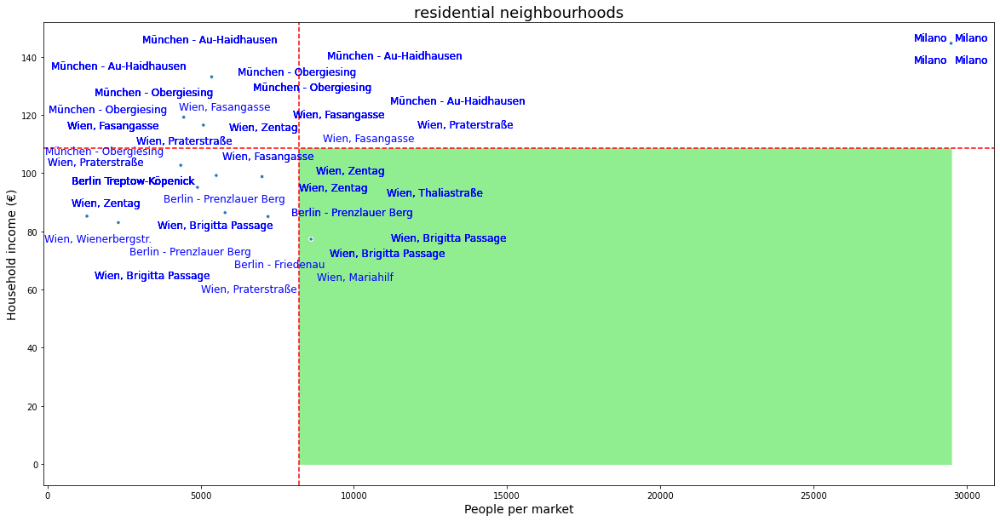

In [401]:
import seaborn as sns
from adjustText import adjust_text
plt.figure(figsize=(20,10))

# Add horizontal and vertical lines to mark the median values
avg_people_per_market = residential['People per Market'].mean()
max_people_per_market = residential['People per Market'].max()
avg_income = residential['Household with 1km Purchasing Power Index'].mean()

plt.axhline(y=avg_income, color='r', linestyle='--')
plt.axvline(x=avg_people_per_market, color='r', linestyle='--')

# Highlight the optimal quadrant
plt.fill_between(x=np.arange(avg_people_per_market, max_people_per_market), y1=0, y2=avg_income, color='lightgreen')

# Draw and label the neighbourhood points
scatter_text('People per Market', 'Household with 1km Purchasing Power Index', 'Store name',
             data = residential, 
             title = 'residential neighbourhoods', 
             xlabel = 'People per market',
             ylabel = 'Household income (€)')

In [426]:
df_final = pd.read_excel('finel_result_hw.xlsx', sheet_name='Sheet1')

In [427]:
final=df_final[['Store name','Annual Total Gross Turnover*']]

In [432]:
final

,Store name,Annual Total Gross Turnover*
0,"Wien, Zentag",7.853209e+05
1,"Wien, Zentag",8.263744e+05
2,"Wien, Zentag",7.658354e+05
3,"Wien, Zentag",7.529369e+05
4,"Wien, Brigitta Passage",1.237177e+06
5,"Wien, Brigitta Passage",1.311792e+06
6,"Wien, Brigitta Passage",1.294183e+06
7,"Wien, Brigitta Passage",1.342785e+06
8,"Wien, Thaliastraße",4.425396e+05
9,"Wien, Thaliastraße",8.271286e+05
